In [37]:
import json
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
import os
import sys
module_path = os.path.abspath(os.path.join(os.pardir, os.pardir))
if module_path not in sys.path:
    sys.path.append(module_path)    
import pandas as pd
import nltk
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.tokenize import regexp_tokenize, word_tokenize, RegexpTokenizer
import matplotlib.pyplot as plt
import string
import re
import numpy as np
from nltk.tokenize import word_tokenize # nltk's gold standard word tokenizer
from nltk.tokenize import sent_tokenize # nltk's sentence tokenizer
from nltk.corpus import stopwords
import itertools
from nltk import WordNetLemmatizer # lemmatizer using WordNet
from nltk.corpus import wordnet # imports WordNet
from nltk import pos_tag # nltk's native part of speech tagging
import nltk
from itertools import chain
nltk.download("stopwords")
nltk.download('punkt') 
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jalilsarwari/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/jalilsarwari/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/jalilsarwari/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/jalilsarwari/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [32]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:         
        return None

In [33]:
    
def first_step_normalizer(doc,stop_words):
    # filters for alphabetic (no punctuation or numbers) and filters out stop words. 
    # lower cases all tokens
    norm_text = []
    for x in word_tokenize(doc):
        if x.isalpha():
            x = x.lower()
        if x not in stop_words and '@' not in x:
            norm_text.append(x)
    return norm_text

In [116]:
def make_cloud(name):
    message = []

    # Opening JSON file
    filepath = 'user_data/' + name + '/' + name + '_messages.json'
    f = open(filepath)

    # returns JSON object as 
    # a dictionary
    data = json.load(f)

    # Iterating through the json
    # list
    for i in data:
        try:
            if i['media'] == None:
                message.append(i['message'])
        except:pass
    # Closing file
    f.close()

    corpus = [word_tokenize(doc) for doc in message]
    flattenedcorpus_tokens = pd.Series(list(itertools.chain(*corpus)))
    dictionary = pd.Series(
        flattenedcorpus_tokens.unique())
    stop_words = stopwords.words('english')
    new_words = ['u','ur',',','https',"'","i'm",'like','lol','get','one','http',
                "reeee","bro","need","tbh","ppl","wow","dude","ye","okay","ik","ep",
                 "ya","plz","need","look","idk","c",'b','imo','smh','haha',"n't",
                '.first','wtf','ta','im',"’"]
                #'think','make','play','jalil','good','game','go']
    stop_words = stop_words + new_words
    token_norm = [first_step_normalizer(x,stop_words) for x in message]
    
    token_norm_tagged = [pos_tag(x) for x in token_norm]
    wordnet_tagged = []
    for sentence in token_norm_tagged:
        wordnet_tagged.append([(x[0], pos_tagger(x[1])) for x in sentence])
    flattened_wordnet_tagged =  list(chain.from_iterable(wordnet_tagged))
    wnl = WordNetLemmatizer()
    doc_lemmatized = [wnl.lemmatize(token, pos) for token, pos in flattened_wordnet_tagged if pos is not None]
    comment_words = ''
    

    # iterate through the csv file
    for val in doc_lemmatized:

        # typecaste each val to string
        val = str(val)

        # split the value
        tokens = val.split()

        # Converts each token into lowercase
        for i in range(len(tokens)):
            tokens[i] = tokens[i].lower()

        comment_words += " ".join(tokens)+" "
    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stop_words,
                    min_font_size = 10).generate(comment_words)

    # plot the WordCloud image                      
    plt.figure(figsize = (20, 20), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(name+"'s wordcloud'")
    plt.tight_layout(pad = 0)
    outfile = 'user_data/' + name + '/' + name + '_wordcloud'
    plt.savefig(outfile)
    plt.savefig(name)
    plt.show()
    fully_normalized_corpus = []
    for messagess in wordnet_tagged:
        fully_normalized_corpus.append([wnl.lemmatize(token, pos) for token, pos in messagess if pos is not None])
    outfile = 'user_data/' + name + '/' + name + '_normalized.csv'
    
    fnc_output = pd.Series(fully_normalized_corpus).apply(
    " ".join)

    fnc_output.to_csv(outfile)

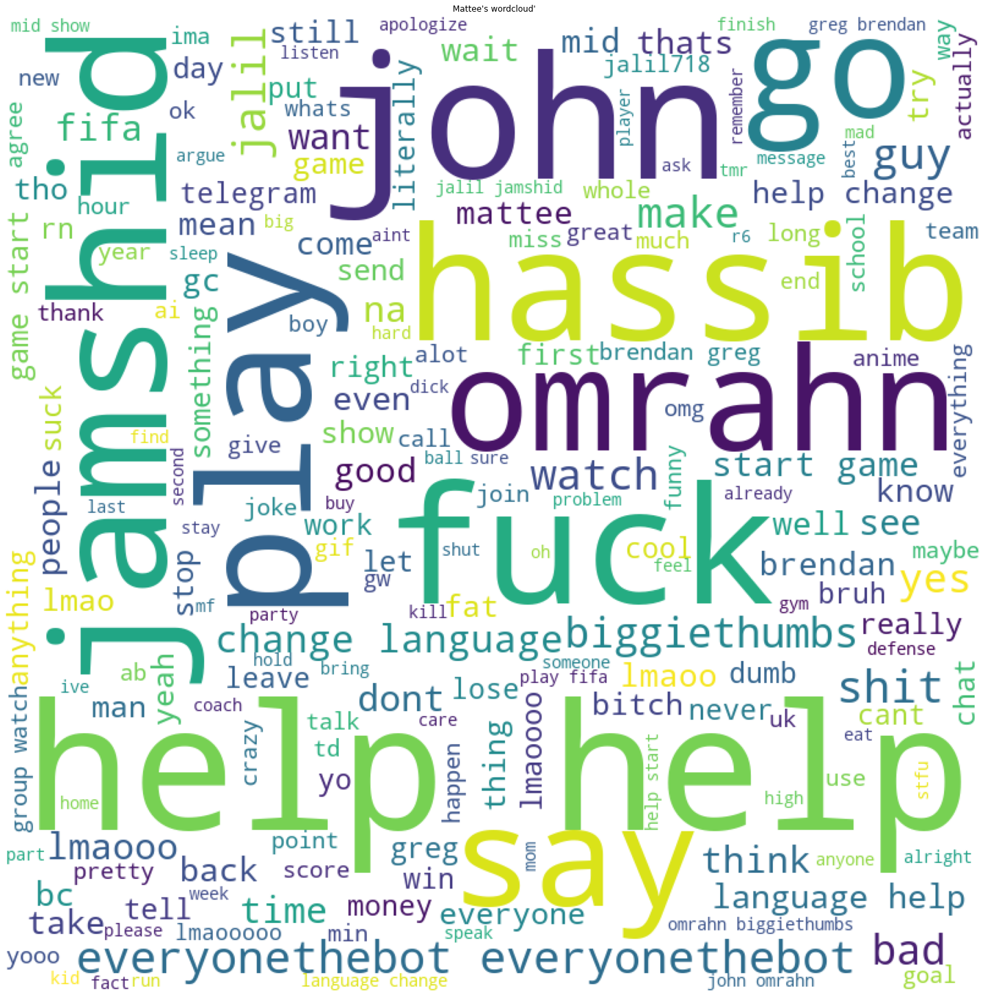

AttributeError: 'list' object has no attribute 'apply'

In [111]:
make_cloud('Mattee')

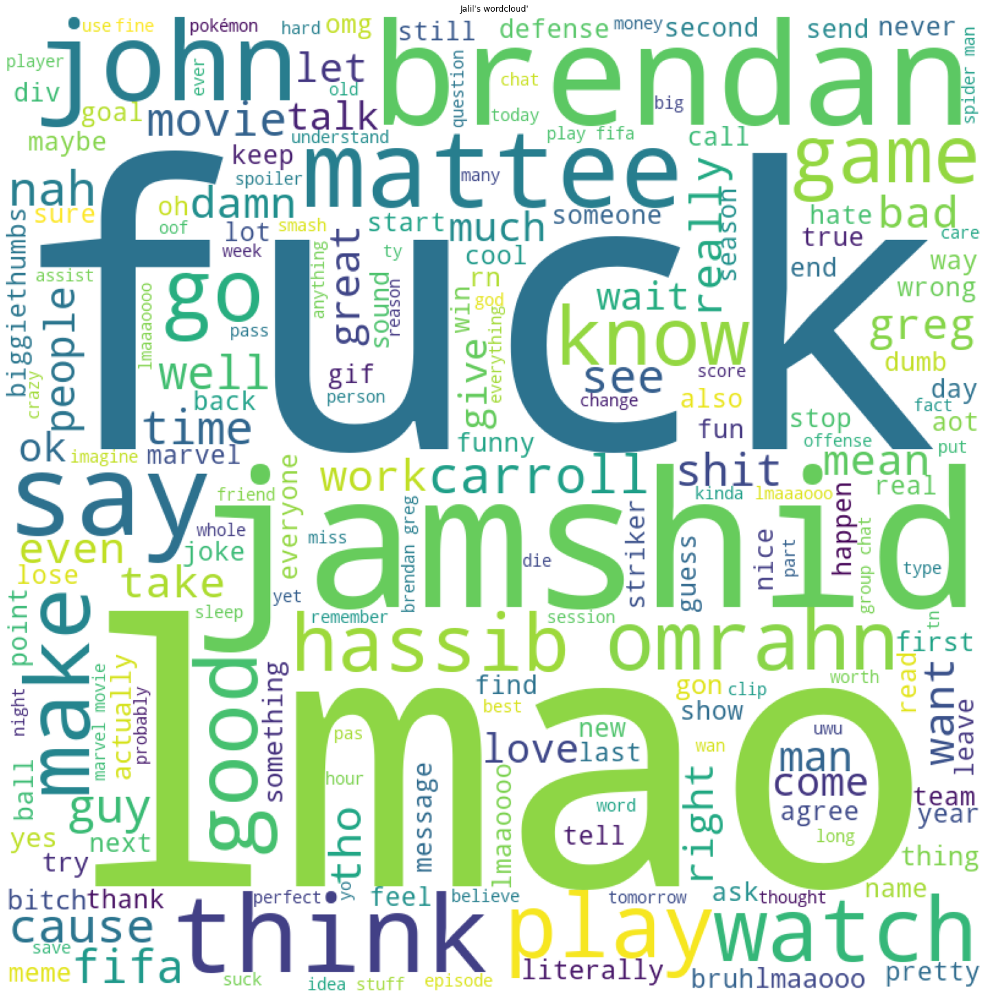

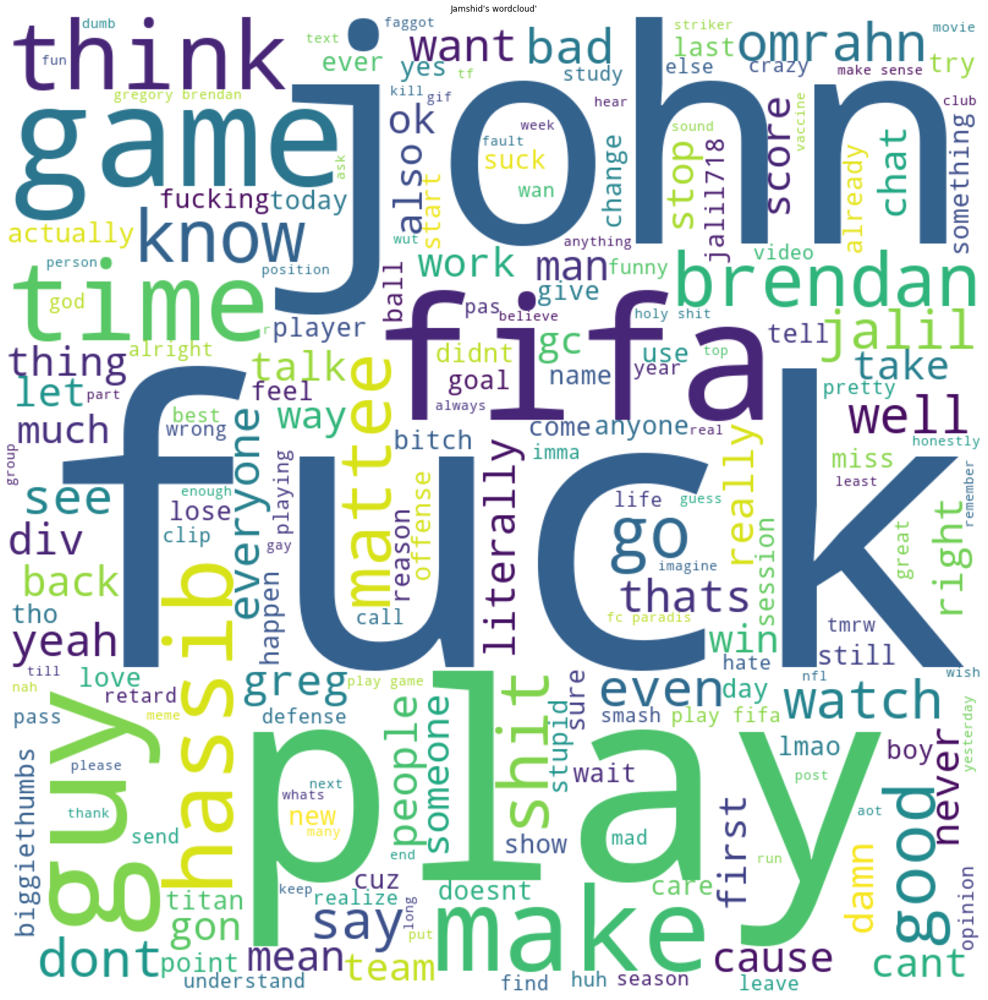

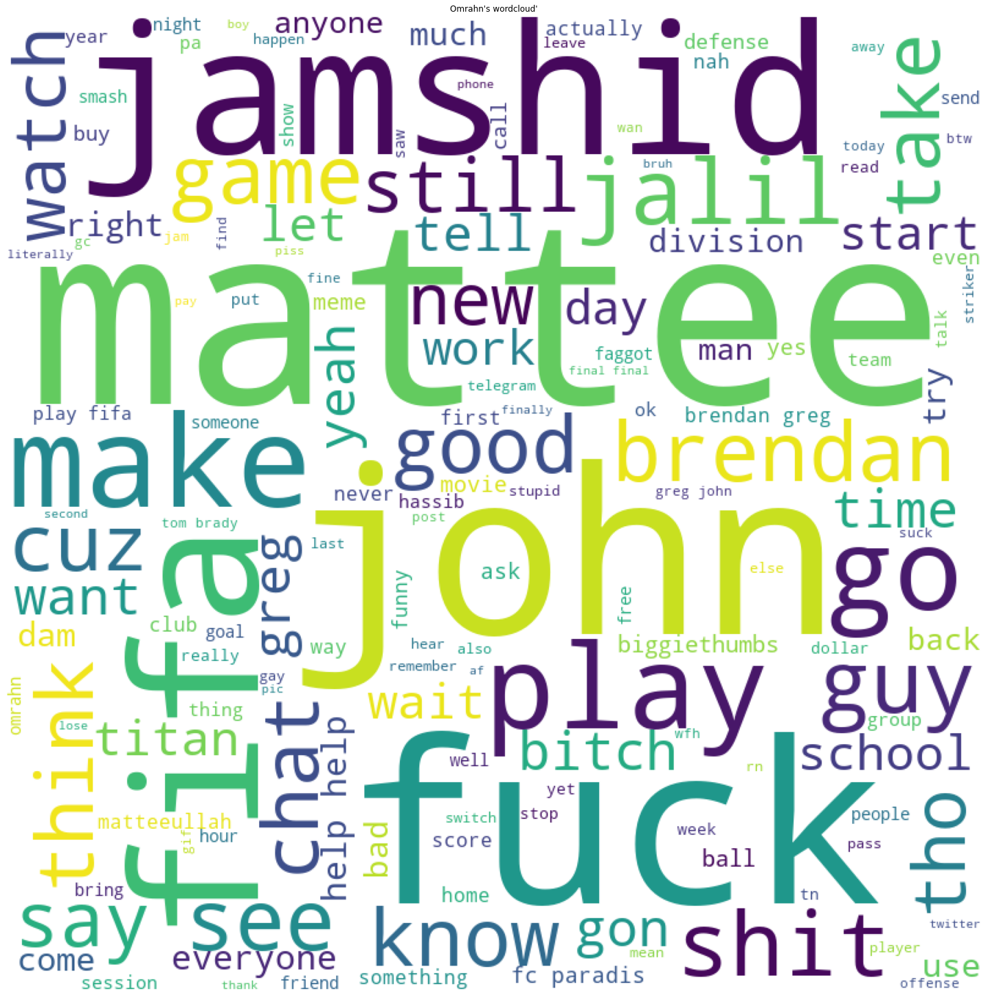

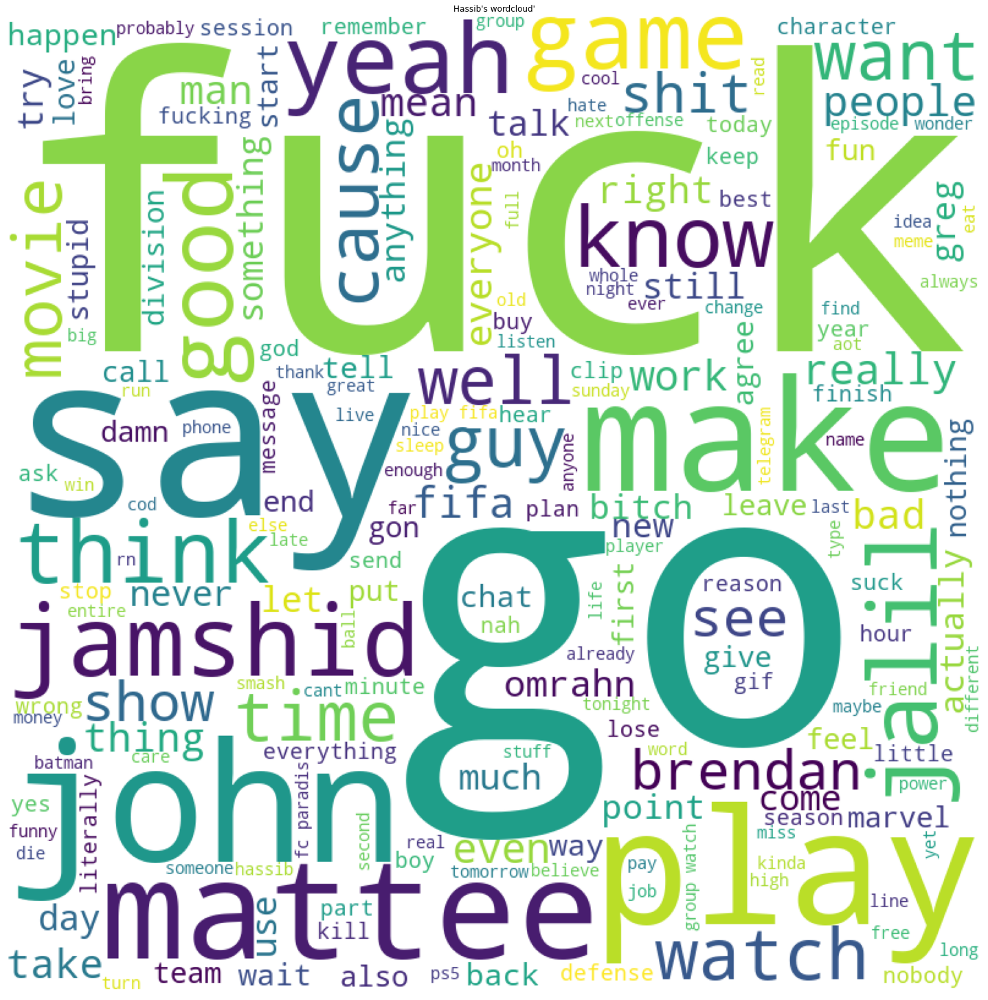

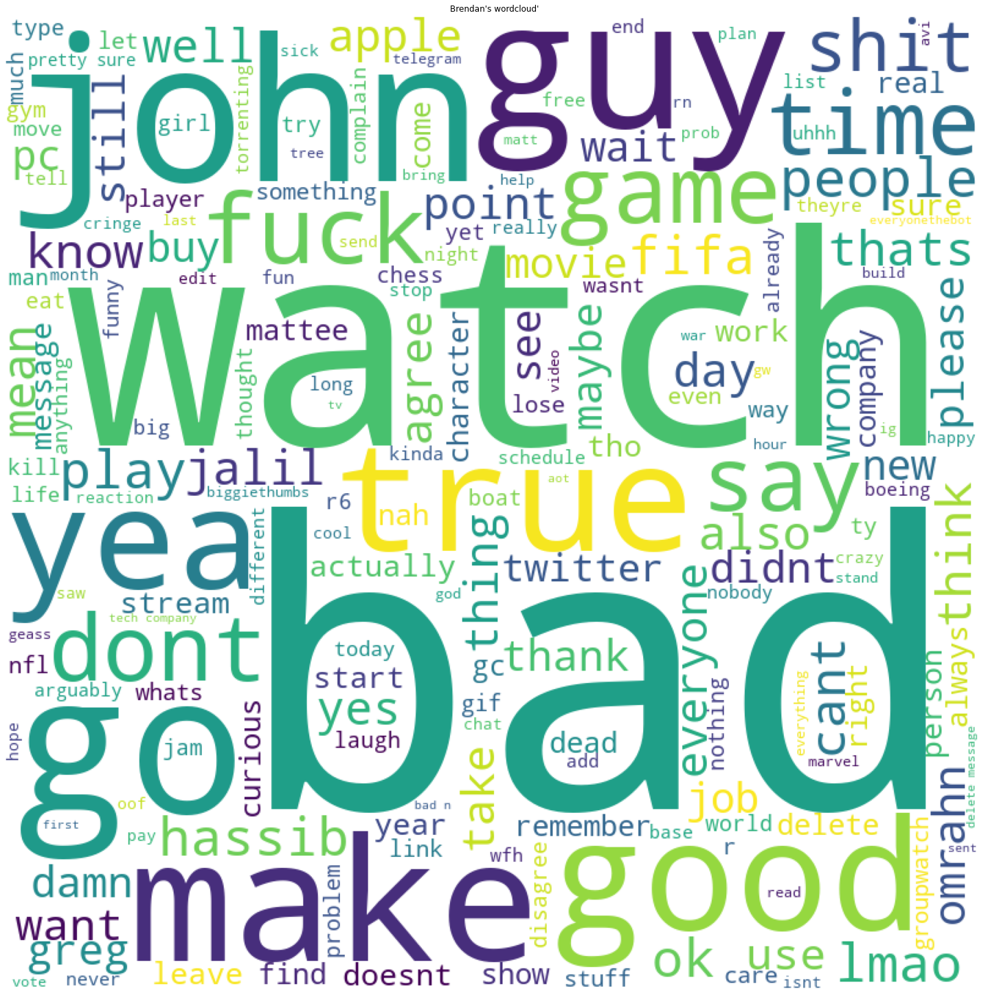

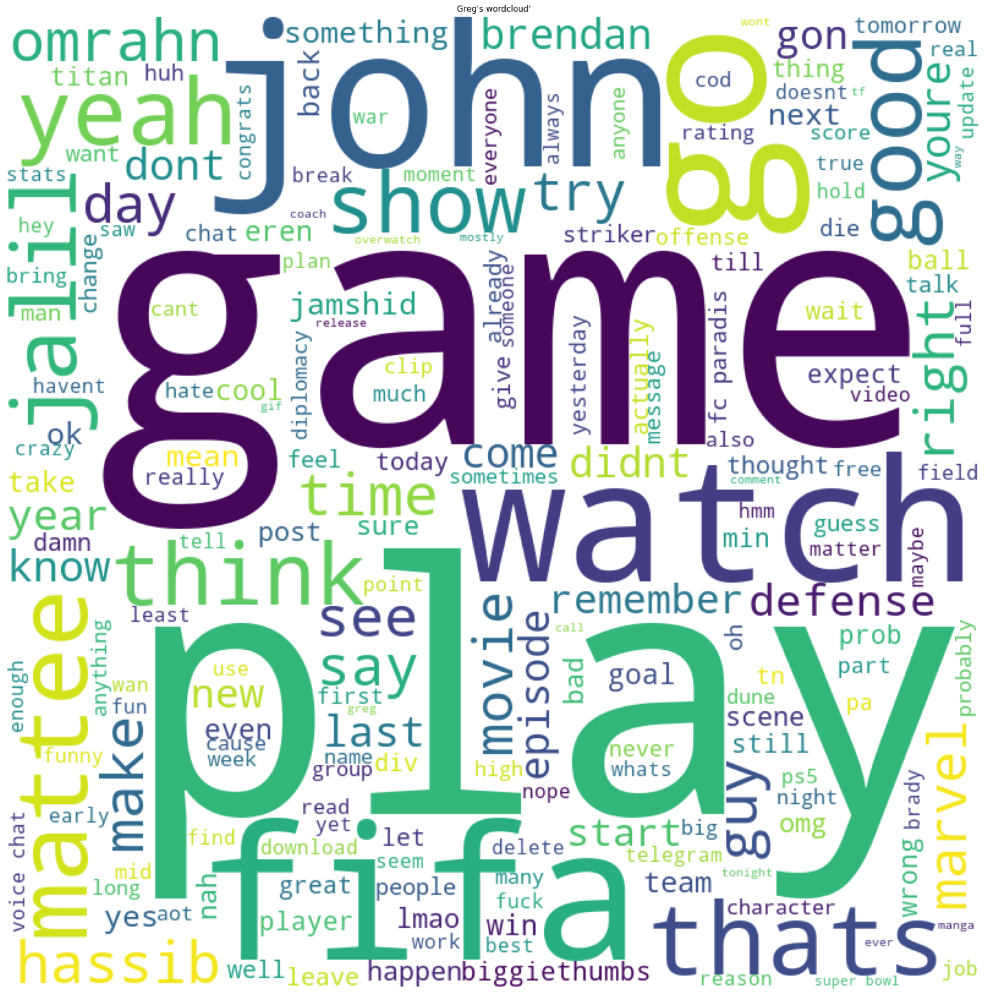

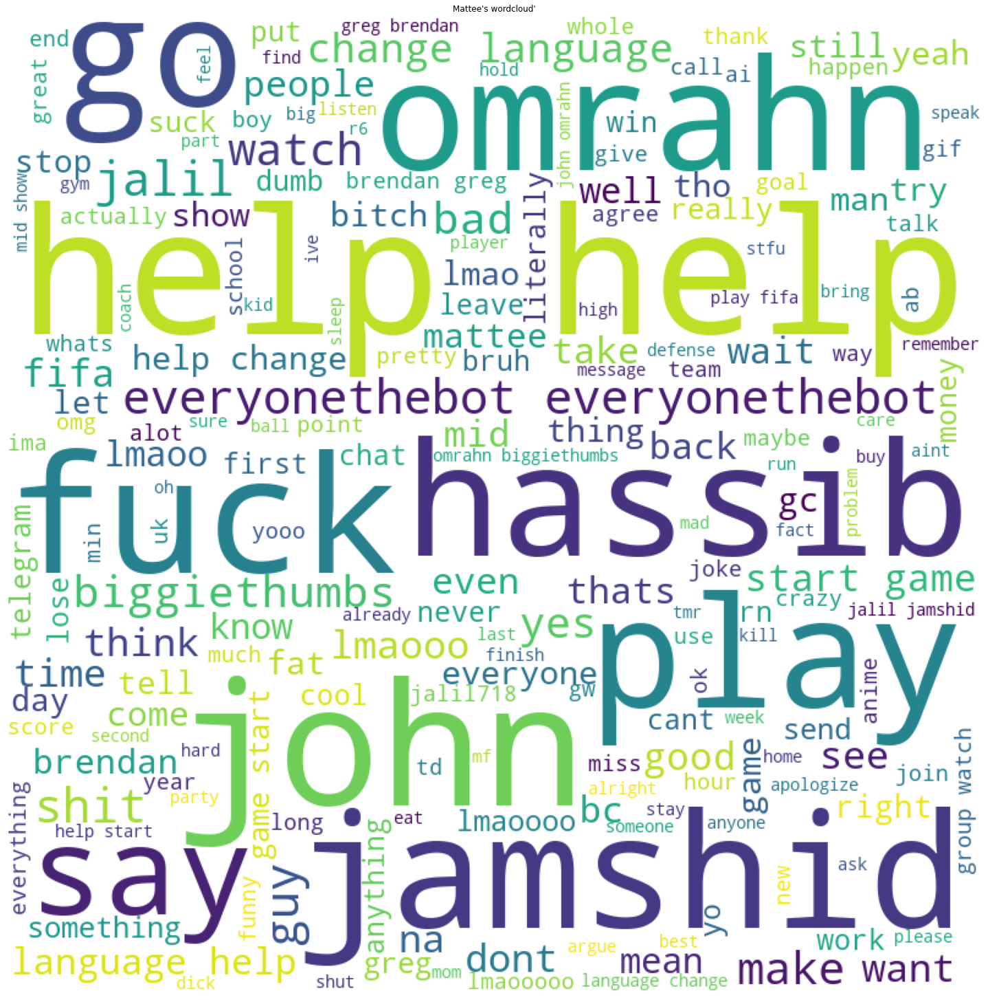

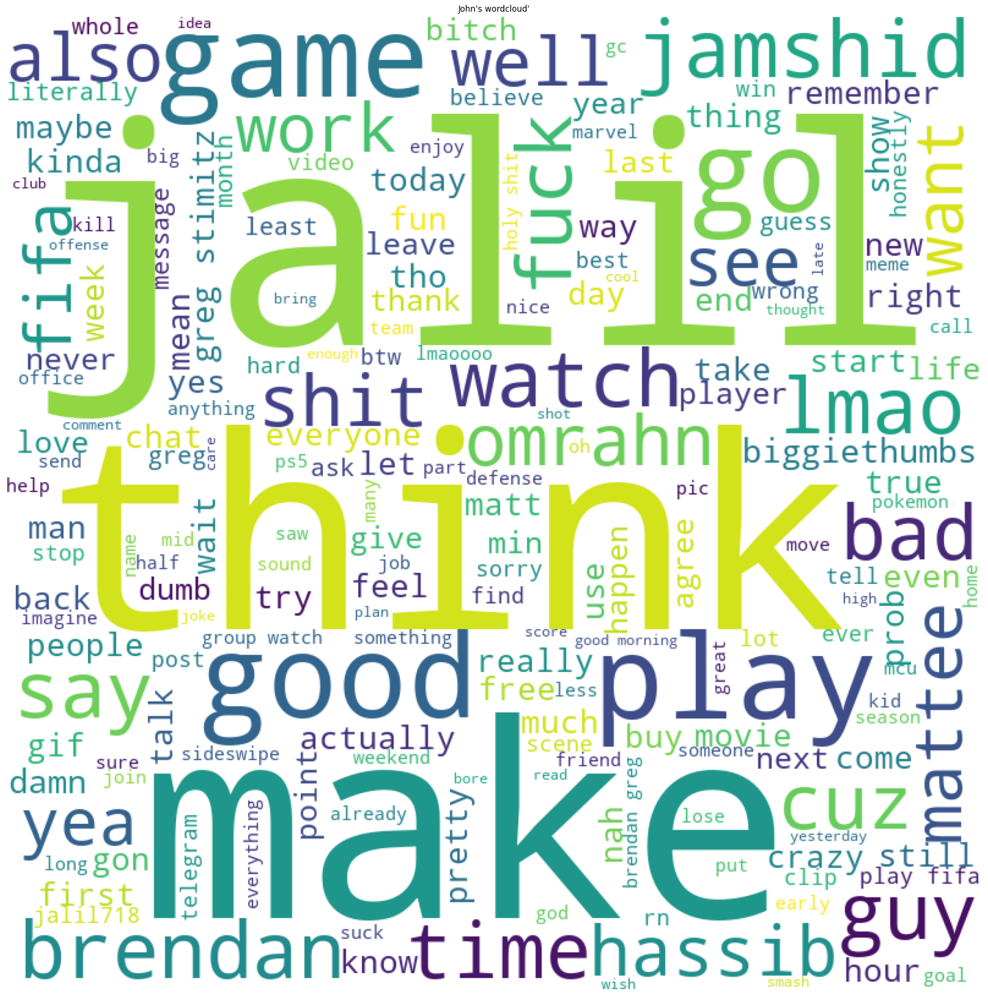

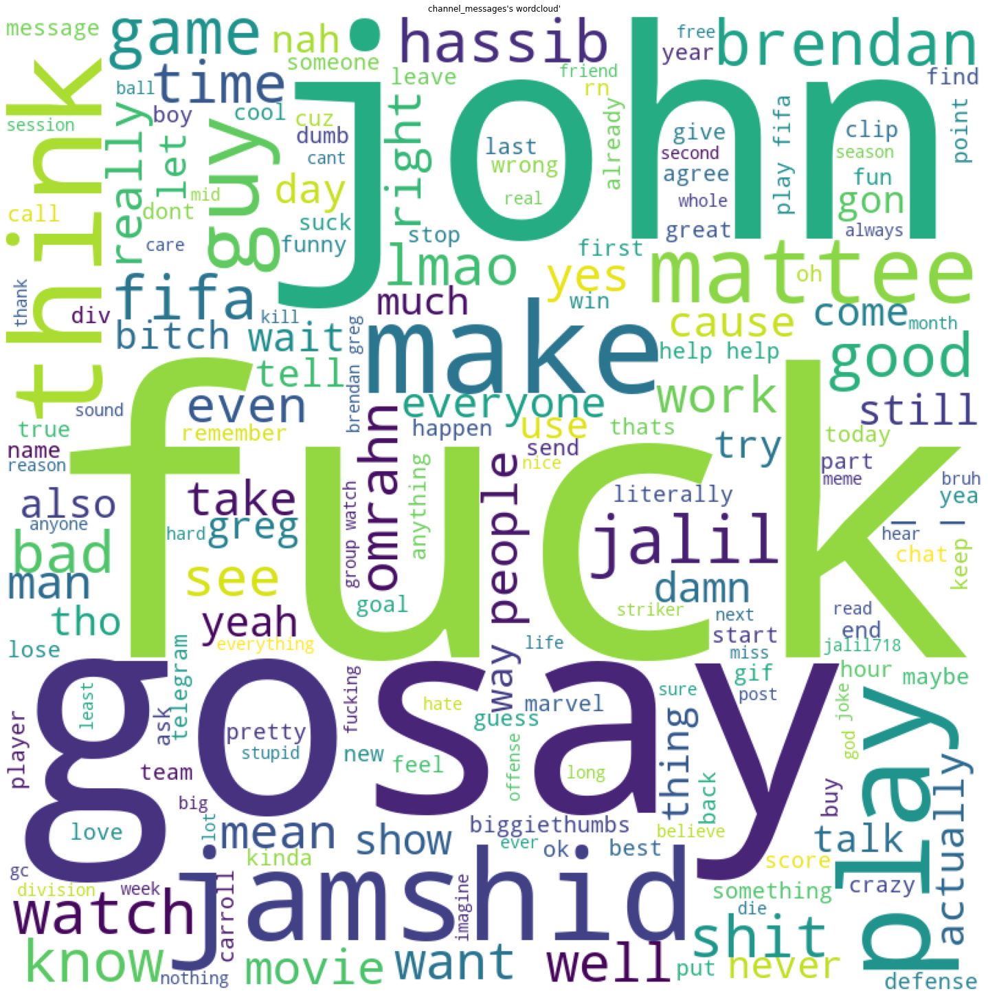

In [118]:
names = ['Jalil','Jamshid','Omrahn','Hassib','Brendan','Greg','Mattee','John','channel_messages']
for x in names:    
    make_cloud(x)

In [98]:

doc_lemmatized_unflat = [wnl.lemmatize(token, pos) for token, pos in flattened_wordnet_tagged if pos is not None]

In [97]:
message

['Omrahn do it for the memes',
 'He’s practically your idol at this point',
 'Do it',
 'U guys should try to get on the tik tok',
 'The animation is insane',
 'He beat me by one sec',
 'Just finished watching op',
 'Brendan laughing',
 'Something',
 'Tik tok will be a thing on the side',
 'Im just here so i can become a pt',
 'Ik more than my coach in terms of actual performance',
 'Ye thats why im in college',
 'Profit',
 'From there we can tree branch their interest into other things',
 'But increase interest',
 'True',
 'Not trye',
 'It turns heads',
 'Like make up some shit so crazy',
 'No i mean',
 'I then wanted to find a way to correlate that to my fields of interest',
 'I was thinking ab how a persona like andrew tate can speak topics into relevance',
 'Y’all don’t just talk ab money?',
 '…',
 'What are some huge things that grew from social media',
 'Hold on',
 'Alright',
 'Interesting',
 '…',
 '?',
 'So no',
 'So no way to profit?',
 'Yk',
 'I wouldn’t do this for free unless

In [106]:
fully_normalized_corpus = []
for messagess in wordnet_tagged:
    fully_normalized_corpus.append([wnl.lemmatize(token, pos) for token, pos in messagess if pos is not None])

In [107]:
fully_normalized_corpus

[['omrahn', 'meme'],
 ['’', 'practically', 'idol', 'point'],
 [],
 ['guy', 'try', 'tik', 'tok'],
 ['animation', 'insane'],
 ['beat', 'sec'],
 ['finish', 'watch', 'op'],
 ['brendan', 'laugh'],
 ['something'],
 ['tik', 'tok', 'thing', 'side'],
 ['become', 'pt'],
 ['coach', 'term', 'actual', 'performance'],
 ['thats', 'college'],
 ['profit'],
 ['tree', 'branch', 'interest', 'thing'],
 ['increase', 'interest'],
 ['true'],
 ['trye'],
 ['turn', 'head'],
 ['make', 'shit', 'crazy'],
 ['mean'],
 ['want', 'find', 'way', 'correlate', 'field', 'interest'],
 ['think', 'ab', 'persona', 'andrew', 'tate', 'speak', 'topic', 'relevance'],
 ['’', '’', 'talk', 'money'],
 ['…'],
 ['huge', 'thing', 'grow', 'social', 'medium'],
 ['hold'],
 ['alright'],
 ['interest'],
 ['…'],
 [],
 [],
 ['way', 'profit'],
 ['yk'],
 ['’', 'free', 'convo'],
 ['’', 'job'],
 ['shit', 'blah', 'blah'],
 ['na', 'mean', 'posting', 'update'],
 ['profit', 'reddit'],
 ['faster'],
 ['define', 'weird', 'friend'],
 ['fault', 'ree'],
 ['’',

In [114]:
fnc_output = pd.Series(fully_normalized_corpus).apply(
    " ".join)

fnc_output.to_csv("satire_norm.csv")

In [115]:
fnc_output

0                    omrahn meme
1       ’ practically idol point
2                               
3                guy try tik tok
4               animation insane
                  ...           
7281                         yes
7282                        john
7283                       agree
7284                       score
7285                     jamshid
Length: 7286, dtype: object